In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

from astropy import constants as const
from astropy import units as u
from scipy.special import hermite

from scipy.integrate import quad

### Quantum Harmonic Oscillator

The quantum harmonic oscillator serves as a fundamental model in quantum mechanics due to its solvable nature and resemblance to many physical systems. Here, we will solve the time-independent Schrödinger equation for a one-dimensional quantum harmonic oscillator.

#### Problem Statement

A particle of mass $m$ is subjected to a harmonic potential:

$$ V(x) = \frac{1}{2} m \omega^2 x^2 $$

The time-independent Schrödinger equation for this system is:

$$ -\frac{\hbar^2}{2m} \frac{d^2\psi(x)}{dx^2} + \frac{1}{2} m \omega^2 x^2 \psi(x) = E \psi(x) $$

Where:
- $\hbar$ is the reduced Planck's constant.
- $\omega$ is the angular frequency of the oscillator.
- $E$ is the energy eigenvalue we want to find.

#### Step 1: Introducing Dimensionless Variables

A common technique to simplify the equation is to introduce dimensionless variables. Let's define:

$$ \xi = \sqrt{\frac{m\omega}{\hbar}} x $$

Substituting this into our Schrödinger equation and dividing everything by 2, we get:

$$ \frac{1}{2} \frac{d^2\psi(\xi)}{d\xi^2} - \frac{1}{2} \xi^2 \psi(\xi) = -\frac{E}{\hbar \omega} \psi(\xi) $$


This new equation is in terms of the dimensionless variable $\xi$ and has fewer constants, making it easier to solve. The subsequent steps will involve finding a solution to this equation.

#### Step 2: Series Solution Approach

The differential equation:
$$ \frac{1}{2} \frac{d^2\psi(\xi)}{d\xi^2} - \frac{1}{2} \xi^2 \psi(\xi) = -\frac{E}{\hbar \omega} \psi(\xi) $$
is challenging to solve directly. Therefore, we assume a solution in terms of a power series and determine the coefficients that satisfy the equation.

1. **Power Series Assumption**:
   Assume:
   $$ \psi(\xi) = \sum_{n=0}^{\infty} a_n \xi^n $$
   Where $a_n$ are the coefficients to be found.

2. **Substitution**:
   Insert the power series into the differential equation.

3. **Coefficient Matching**:
   By comparing coefficients of similar powers of $\xi$, we can derive a recursion relation for the $a_n$.

4. **Termination**:
   To ensure the solution is physically meaningful (the wave function is normalizable), the series should terminate after some terms. This leads to the quantization of energy levels.

#### Step 3: Quantization of Energy and Wavefunctions

From the termination requirement, we can determine:

1. **Quantized Energy Levels**:
   $$ E_n = \left( n + \frac{1}{2} \right) \hbar \omega $$
   Where $n = 0, 1, 2, ...$

2. **Wavefunctions**:
   Using the terminated series and the established recursion relation, we find wave functions in terms of Hermite polynomials:
   $$ \psi_n(\xi) = A_n H_n(\xi) e^{-\xi^2/2} $$
   Where $A_n$ is a normalization constant.

##### About Hermite Polynomials

Hermite polynomials are a sequence of orthogonal polynomials that arise frequently in quantum mechanics, especially in problems with a harmonic potential. They have the general form:
$$ H_n(\xi) = (-1)^n e^{\xi^2} \frac{d^n}{d\xi^n} e^{-\xi^2} $$

The first few Hermite polynomials are:
- $H_0(\xi) = 1$
- $H_1(\xi) = 2\xi$
- $H_2(\xi) = 4\xi^2 - 2$
- $H_3(\xi) = 8\xi^3 - 12\xi$
- $H_4(\xi) = 16\xi^4 - 48\xi^2 + 12$

The Hermite polynomials have specific recurrence and orthogonality relations, making them suitable for the quantum harmonic oscillator problem. They ensure the different energy eigenstates of the system are orthogonal.

##### The Normalized Wavefunction:

- $A_n$: To normalize the wavefunction, the coefficient $A_n$ is chosen as:
  $$ A_n = \sqrt{\frac{1}{\sqrt{\pi} 2^n n!}} $$
  This ensures that the integral of $|\psi_n(\xi)|^2$ over all space equals 1.

- $\xi$: As previously defined, the dimensionless parameter $\xi$ is given by:
  $$ \xi = \sqrt{\frac{m\omega}{\hbar}} x $$

- $E_n$: The quantized energy levels, derived from the requirement of normalizability, are:
  $$ E_n = \left( n + \frac{1}{2} \right) \hbar \omega $$
  where $n$ is a non-negative integer.
  

Given all our substitutions and the use of Hermite polynomials, the wavefunction for the quantum harmonic oscillator becomes:

$$ \psi_n(x) = A_n H_n\left(\sqrt{\frac{m\omega}{\hbar}} x\right) e^{-\frac{m\omega}{2\hbar} x^2} $$


In [2]:
# Choose w so that we have some reasonable units to work with.
w = 2.0 * pow(10, 15) * u.Hz

# Generate x values
x = np.linspace(-1, 1, 400) * u.nm

m = const.m_e

In [3]:
def energy(n, m, w):
    return ((n + 0.5)*const.hbar*w).to(u.eV)

def psi (n, m, w, x):
    xi = (np.sqrt(m * w / const.hbar).to(1/x.unit) * x).value
    normalization = np.sqrt(1.0 / (np.sqrt(np.pi) * 2**n * np.math.factorial(n)))
    return normalization * hermite(n)(xi) * np.exp(-xi**2 / 2)

def V(x, m, w):
    # Potential V(x) = 1/2 * m * w^2 * x^2
    return (0.5 * m * w**2 * x**2).to(u.eV)

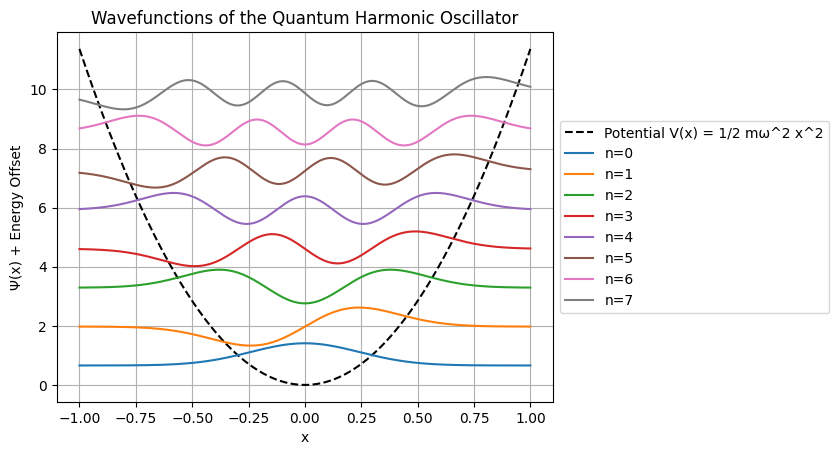

In [4]:
# First plot the time independent solutions at their energy levels
plt.plot(x, V(x, m, w).value, 'k--', label="Potential V(x) = 1/2 mω^2 x^2")

# Plot the first few wavefunctions
for n in range(8):
    # Offset the wavefunctions by their energy level for clarity in plotting
    E = energy(n, m, w).value
    plt.plot(x, psi(n, m, w, x) + E, label=f"n={n}")

plt.title("Wavefunctions of the Quantum Harmonic Oscillator")
plt.xlabel("x")
plt.ylabel("Ψ(x) + Energy Offset")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True)
plt.show()


In [5]:
def psi_time_dep(n, m, w, x, t):
    # Time-independent part
    psi_n_x = psi(n, m, w, x)
    
    # Energy of the nth state
    E_n = energy(n, m, w)    
    
    return psi_n_x * np.exp(-1j*E_n/const.hbar*t)

In [6]:
# Examine how the real and imaginary parts of the wave function vary over time
# Overlay the probability density, but note this remains unchanged with time.
fig, ax = plt.subplots(figsize=(10, 8))

n = 3 # Try out different values of n.

# Plot the probability density, which remains unchanged with time
wavefunc = psi_time_dep(n, m, w, x, 0*u.s)
prob_density = wavefunc * np.conj(wavefunc)

# Take only the real component - discards small, insignificant imaginary parts due to numerical errors.
prob_density = prob_density.real  
ax.fill_between(x.value, prob_density, color='gray', alpha=0.3, label='Probability Density')

line_real, = ax.plot(x, psi_time_dep(n, m, w, x, 0*u.s).real, label='Real Part')
line_imag, = ax.plot(x, psi_time_dep(n, m, w, x, 0*u.s).imag, '--', label='Imaginary Part')

ax.set_xlim(-1, 1)
ax.set_ylim(-1, 1.0)
ax.set_title(f'Time Evolution of Wave Function for n={n}')
ax.set_xlabel('Position (nm)')
ax.set_ylabel('Amplitude')
ax.legend(loc='upper right', facecolor='white', edgecolor='black')
ax.grid(True)

def update(t):
    wavefunc = psi_time_dep(n, m, w, x, t*u.s)
    line_real.set_ydata(wavefunc.real)
    line_imag.set_ydata(wavefunc.imag)
    return line_real, line_imag

E = energy(n, m, w)
T = (2 * np.pi * const.hbar / E).to(u.s).value  # Set time range for full period.
ani = FuncAnimation(fig, update, frames=np.linspace(0, T, 100), blit=True, repeat=True)
plt.close(fig)

# Display the animation in this cell only as an HTML5 video
HTML(ani.to_jshtml())